### What i am Aiming for in this assignment

In this checkpoint, i am going to work on the 'Climate change in Africa' dataset that was provided by the U.S global change research program.

Dataset description : This dataset contains historical data about the daily min, max and average temperature fluctuation in 5 African countries (Egypt, Tunisia, Cameroon, Senegal, Angola) between 1980 and 2023.

➡️ Dataset link: https://drive.google.com/file/d/1I8eV4-8p61CNNlVJzzho2xeoZ5-P7Q0F/view

https://i.imgur.com/w2czdso.jpg

### Instructions

- Load the dataset into a data frame using Python.
- Clean the data as needed.
- Plot a line chart to show the average temperature fluctuations in Tunisia and Cameroon. Interpret the results.
- Zoom in to only include data between 1980 and 2005, try to customize the axes labels.
- Create Histograms to show temperature distribution in Senegal between [1980,2000] and [2000,2023] (in the same figure). Describe the obtained results.
- Select the best chart to show the Average temperature per country.
- Make your own questions about the dataset and try to answer them using the appropriate visuals.

In [69]:
import pandas as pd
import numpy as np

In [197]:
# Loading the dataset into a data frame using Python.
data = pd.read_csv("Africa_climate_change.csv")

In [198]:
data

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,19800101 000000,NaN,54.0,61.0,43.0,Tunisia
1,19800101 000000,NaN,49.0,55.0,41.0,Tunisia
2,19800101 000000,0.0,72.0,86.0,59.0,Cameroon
3,19800101 000000,NaN,50.0,55.0,43.0,Tunisia
4,19800101 000000,NaN,75.0,91.0,NaN,Cameroon
...,...,...,...,...,...,...
464810,20230823 000000,NaN,85.0,89.0,NaN,Senegal
464811,20230823 000000,NaN,80.0,90.0,72.0,Egypt
464812,20230823 000000,NaN,87.0,NaN,73.0,Egypt
464813,20230823 000000,0.0,82.0,94.0,NaN,Senegal


In [199]:
data.head()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,19800101 000000,NaN,54.0,61.0,43.0,Tunisia
1,19800101 000000,NaN,49.0,55.0,41.0,Tunisia
2,19800101 000000,0.0,72.0,86.0,59.0,Cameroon
3,19800101 000000,NaN,50.0,55.0,43.0,Tunisia
4,19800101 000000,NaN,75.0,91.0,NaN,Cameroon


In [200]:
data.tail()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
464810,20230823 000000,NaN,85.0,89.0,NaN,Senegal
464811,20230823 000000,NaN,80.0,90.0,72.0,Egypt
464812,20230823 000000,NaN,87.0,NaN,73.0,Egypt
464813,20230823 000000,0.0,82.0,94.0,NaN,Senegal
464814,20230823 000000,NaN,83.0,NaN,NaN,Cameroon


In [201]:
data.dtypes

DATE        object
PRCP       float64
TAVG       float64
TMAX       float64
TMIN       float64
COUNTRY     object
dtype: object

In [202]:
data.isnull().sum()

DATE            0
PRCP       287240
TAVG         6376
TMAX       100914
TMIN       132058
COUNTRY         0
dtype: int64

In [203]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464815 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   DATE     464815 non-null  object 
 1   PRCP     177575 non-null  float64
 2   TAVG     458439 non-null  float64
 3   TMAX     363901 non-null  float64
 4   TMIN     332757 non-null  float64
 5   COUNTRY  464815 non-null  object 
dtypes: float64(4), object(2)
memory usage: 21.3+ MB


In [204]:
data.describe()

,PRCP,TAVG,TMAX,TMIN
count,177575.000000,458439.000000,363901.000000,332757.000000
mean,0.120941,77.029838,88.713969,65.548262
std,0.486208,11.523634,13.042631,11.536547
min,0.000000,-49.000000,41.000000,12.000000
25%,0.000000,70.000000,81.000000,58.000000
50%,0.000000,80.000000,90.000000,68.000000
75%,0.010000,85.000000,99.000000,74.000000
max,19.690000,110.000000,123.000000,97.000000


### Cleaning the data as needed

In [205]:
# Percentage of data without missing values
len(data.dropna()) / len(data) * 100 

24.469304992308768

In [206]:
# Percentage of data with missing values
100 - len(data.dropna()) / len(data) * 100 

75.53069500769124

In [207]:
# Filling the missing data
def filling_missing_data(column):
    if column.dtype == np.dtype("int64"):
        return column.fillna(column.mean())
    
    if column.dtype == np.dtype("float64"):
        return column.fillna(column.mean())
    
    if column.dtype == np.dtype("object"):
        return column.fillna(column.mode()[0])

In [208]:
for column in data:
    data[column] = filling_missing_data(data[column])

In [209]:
data.isnull().sum()

DATE       0
PRCP       0
TAVG       0
TMAX       0
TMIN       0
COUNTRY    0
dtype: int64

In [210]:
data.head()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,19800101 000000,0.120941,54.0,61.0,43.000000,Tunisia
1,19800101 000000,0.120941,49.0,55.0,41.000000,Tunisia
2,19800101 000000,0.000000,72.0,86.0,59.000000,Cameroon
3,19800101 000000,0.120941,50.0,55.0,43.000000,Tunisia
4,19800101 000000,0.120941,75.0,91.0,65.548262,Cameroon


In [211]:
data

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,19800101 000000,0.120941,54.0,61.000000,43.000000,Tunisia
1,19800101 000000,0.120941,49.0,55.000000,41.000000,Tunisia
2,19800101 000000,0.000000,72.0,86.000000,59.000000,Cameroon
3,19800101 000000,0.120941,50.0,55.000000,43.000000,Tunisia
4,19800101 000000,0.120941,75.0,91.000000,65.548262,Cameroon
...,...,...,...,...,...,...
464810,20230823 000000,0.120941,85.0,89.000000,65.548262,Senegal
464811,20230823 000000,0.120941,80.0,90.000000,72.000000,Egypt
464812,20230823 000000,0.120941,87.0,88.713969,73.000000,Egypt
464813,20230823 000000,0.000000,82.0,94.000000,65.548262,Senegal


In [234]:
# Coverting the date to normal data form.
data["DATE"] = pd.to_datetime(data["DATE"])

In [213]:
data

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,1980-01-01,0.120941,54.0,61.000000,43.000000,Tunisia
1,1980-01-01,0.120941,49.0,55.000000,41.000000,Tunisia
2,1980-01-01,0.000000,72.0,86.000000,59.000000,Cameroon
3,1980-01-01,0.120941,50.0,55.000000,43.000000,Tunisia
4,1980-01-01,0.120941,75.0,91.000000,65.548262,Cameroon
...,...,...,...,...,...,...
464810,2023-08-23,0.120941,85.0,89.000000,65.548262,Senegal
464811,2023-08-23,0.120941,80.0,90.000000,72.000000,Egypt
464812,2023-08-23,0.120941,87.0,88.713969,73.000000,Egypt
464813,2023-08-23,0.000000,82.0,94.000000,65.548262,Senegal


In [214]:
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [215]:
Tunisia_Cameroon = data[data["COUNTRY"].isin(["Tunisia", "Cameroon"])]

In [216]:
Tunisia_Cameroon.head(30)

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,1980-01-01,0.120941,54.0,61.000000,43.000000,Tunisia
1,1980-01-01,0.120941,49.0,55.000000,41.000000,Tunisia
2,1980-01-01,0.000000,72.0,86.000000,59.000000,Cameroon
3,1980-01-01,0.120941,50.0,55.000000,43.000000,Tunisia
4,1980-01-01,0.120941,75.0,91.000000,65.548262,Cameroon
5,1980-01-01,0.120941,52.0,61.000000,45.000000,Tunisia
22,1980-01-01,0.000000,84.0,91.000000,65.548262,Cameroon
23,1980-01-01,0.120941,49.0,52.000000,65.548262,Tunisia
31,1980-01-02,0.000000,75.0,91.000000,61.000000,Cameroon
33,1980-01-02,0.120941,59.0,66.000000,48.000000,Tunisia


In [217]:
# Ploting a line chart to show the average temperature fluctuations in Tunisia and Cameroon. Interpret the results.
px.line(Tunisia_Cameroon.TAVG, color=Tunisia_Cameroon.COUNTRY)

According to the line chart plot above, it shows that the average temperature in cameroon is higher when compared to Tunisia.

In [218]:
tun_cam_data = Tunisia_Cameroon[(Tunisia_Cameroon['DATE'] >= '1980-01-01') & (Tunisia_Cameroon['DATE'] <= '2005-12-31')]

In [219]:
tun_cam_data

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,1980-01-01,0.120941,54.0,61.000000,43.000000,Tunisia
1,1980-01-01,0.120941,49.0,55.000000,41.000000,Tunisia
2,1980-01-01,0.000000,72.0,86.000000,59.000000,Cameroon
3,1980-01-01,0.120941,50.0,55.000000,43.000000,Tunisia
4,1980-01-01,0.120941,75.0,91.000000,65.548262,Cameroon
...,...,...,...,...,...,...
261148,2005-12-31,0.120941,82.0,88.713969,76.000000,Cameroon
261150,2005-12-31,0.000000,54.0,62.000000,65.548262,Tunisia
261158,2005-12-31,0.000000,52.0,63.000000,45.000000,Tunisia
261159,2005-12-31,0.000000,49.0,60.000000,39.000000,Tunisia


In [235]:
# Zooming in to only include data between 1980 and 2005, try to customize the axes labels.
fig = px.line(tun_cam_data, x="DATE", y="TAVG", color=tun_cam_data.COUNTRY, title='Average Temperature Fluctuations in Tunisia and Cameroon between 1980 to 2005')
fig.show()

In [221]:
senegal = data[data.COUNTRY == 'Senegal']
senegal_1 = senegal[(senegal.DATE >= '1980-01-01') & (senegal.DATE <= '2000-12-31')]
senegal_2 = senegal[(senegal.DATE >= '2000-01-01') & (senegal.DATE <= '2023-12-31')]

In [229]:
senegal

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
6,1980-01-01,0.000000,76.0,97.000000,59.000000,Senegal
7,1980-01-01,0.000000,74.0,95.000000,59.000000,Senegal
8,1980-01-01,0.000000,78.0,93.000000,63.000000,Senegal
9,1980-01-01,0.000000,76.0,91.000000,59.000000,Senegal
11,1980-01-01,0.120941,84.0,99.000000,65.548262,Senegal
...,...,...,...,...,...,...
464803,2023-08-23,1.220000,83.0,90.000000,76.000000,Senegal
464807,2023-08-23,0.120941,87.0,99.000000,65.548262,Senegal
464808,2023-08-23,0.160000,82.0,88.713969,65.548262,Senegal
464810,2023-08-23,0.120941,85.0,89.000000,65.548262,Senegal


In [230]:
senegal_1

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
6,1980-01-01,0.000000,76.0,97.0,59.000000,Senegal
7,1980-01-01,0.000000,74.0,95.0,59.000000,Senegal
8,1980-01-01,0.000000,78.0,93.0,63.000000,Senegal
9,1980-01-01,0.000000,76.0,91.0,59.000000,Senegal
11,1980-01-01,0.120941,84.0,99.0,65.548262,Senegal
...,...,...,...,...,...,...
208058,2000-12-31,0.120941,85.0,100.0,65.548262,Senegal
208059,2000-12-31,0.120941,86.0,101.0,65.548262,Senegal
208061,2000-12-31,0.120941,76.0,87.0,65.548262,Senegal
208062,2000-12-31,0.120941,89.0,98.0,65.548262,Senegal


In [222]:
senegal_2

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
198343,2000-01-01,0.000000,75.0,85.000000,66.000000,Senegal
198345,2000-01-01,0.000000,73.0,88.000000,63.000000,Senegal
198346,2000-01-01,0.000000,75.0,88.000000,64.000000,Senegal
198347,2000-01-01,0.000000,74.0,90.000000,64.000000,Senegal
198348,2000-01-01,0.120941,74.0,88.713969,57.000000,Senegal
...,...,...,...,...,...,...
464803,2023-08-23,1.220000,83.0,90.000000,76.000000,Senegal
464807,2023-08-23,0.120941,87.0,99.000000,65.548262,Senegal
464808,2023-08-23,0.160000,82.0,88.713969,65.548262,Senegal
464810,2023-08-23,0.120941,85.0,89.000000,65.548262,Senegal


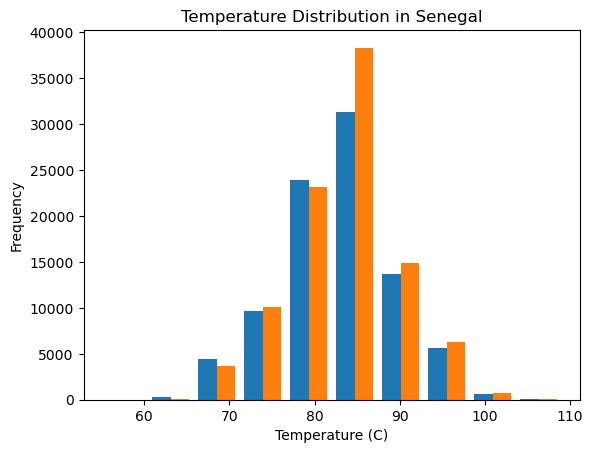

In [236]:
# Creating Histograms to show temperature distribution in Senegal between [1980,2000] and [2000,2023] (in the same figure). Describe the obtained results.
plt.hist([senegal_1.TAVG, senegal_2.TAVG])
plt.xlabel('Temperature (C)')
plt.ylabel('Frequency')
plt.title('Temperature Distribution in Senegal');

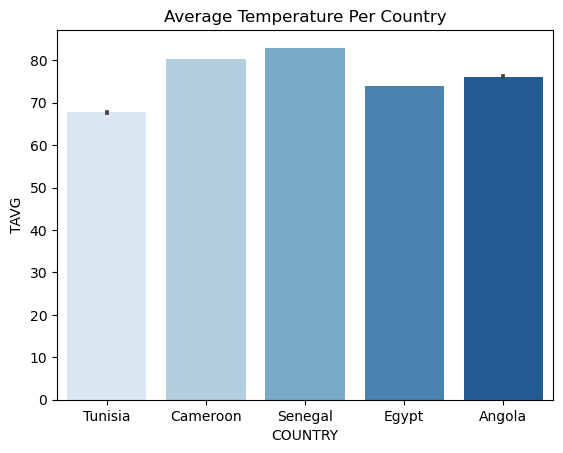

In [237]:
# Select the best chart to show the Average temperature per country.
sns.barplot(x=data.COUNTRY, y=data.TAVG, data=data, palette="Blues",)
plt.title("Average Temperature Per Country");

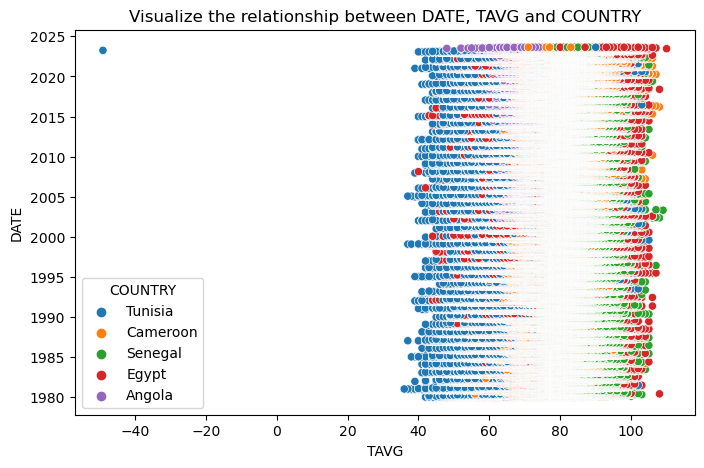

In [238]:
# Visualizing the relationship between different countries and their average temperature with date.
plt.figure(figsize=(8,5))
sns.scatterplot(x="TAVG", y="DATE", hue="COUNTRY", data=data)
plt.title("Visualize the relationship between DATE, TAVG and COUNTRY")
plt.show();